In [ ]:
from tensorflow.keras import backend as K

K.clear_session()

In [ ]:
!pip uninstall -y tensorflow keras

Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0
Found existing installation: keras 2.15.0
Uninstalling keras-2.15.0:
  Successfully uninstalled keras-2.15.0


In [ ]:
!pip install tensorflow==2.10.0 keras==2.10.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 578.0/578.0 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 67.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 102.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 44.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 40.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 55.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.7.2
    Uninstalling tensorboard-data

In [34]:
# General libraries
import os
import random
import numpy as np
import pickle
import glob
import datetime

# Image processing libraries
import cv2
from PIL import Image
from scipy.ndimage import distance_transform_edt

# Machine learning and deep learning libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import TensorBoard
from keras.utils import normalize
from keras.models import Model, load_model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras.metrics import MeanIoU
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [35]:
print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {keras.__version__}")

TensorFlow version: 2.17.0
Keras version: 3.4.1


In [36]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Avoid OOM errors by setting GPU Memory Consumption Growth. Use this block only if you run the training on a local machine
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)



*   In the **image_path** and **mask_path** below we specify where the images and masks are stored.
*   Then with **image_filenames** and **mask_filenames** we retrieve and sort the specified directories.

*   With **image_dataset** and **mask_dataset** we create two empty lists to store our images after the preprocessing stage.
*   After that we are ready to load our images and masks. We iterate through the lists of filenames with a for loop. The **cv2.imread** changes our image to grayscale format. The Image.fromarray converts our numPy array to a PIL image. Essentially, the code transforms the raw image data stored in the NumPy array into a format that PIL can understand and manipulate. This enables us to perform various image processing tasks such as resizing, applying filters, saving the image to a file, etc. After that we resize our images and masks to the **SIZE** we have assigned at the start of the cell we then append them to their respective lists.


*   The reason we are not using the normalized method of cv2 is because we want to normalize the values of grayscale image which typically have a max value of 255. The problem with cv2.normalize is that it will take the max value in that list and use that to divide the rest of the values, so if our max values is less than 255 it will use that.
*   Lastly with the np.expand_dims and np.newaxis we achieve the same thing which is to add a channel dimension to our lists. In np.expand_dims we specify the axis in which we want to do it while with [..., np.newaxis] we use the ellipsis to keep the previous dimensions and add a new one.



In [37]:
# Set the paths for images and masks
image_path = '/content/drive/MyDrive/images'
mask_path = '/content/drive/MyDrive/masks'

# Get list of image and mask filenames
image_filenames = sorted(os.listdir(image_path))
mask_filenames = sorted(os.listdir(mask_path))

SIZE = 512
image_dataset = []
mask_dataset = []

# Load images and masks
for i, (image_name, mask_name) in enumerate(zip(image_filenames, mask_filenames)):
    if (image_name.startswith('sample1_frame_') or image_name.startswith('sample2_frame_')) and \
   (mask_name.startswith('sample1_mask_frame_') or mask_name.startswith('sample2_mask_frame_')):
        # Load color image
        image = cv2.imread(os.path.join(image_path, image_name), cv2.IMREAD_GRAYSCALE)
        image = Image.fromarray(image)
        image = image.resize((SIZE, SIZE))
        image_dataset.append(np.array(image))

        # Load mask
        mask = cv2.imread(os.path.join(mask_path, mask_name), 0)
        mask = Image.fromarray(mask)
        mask = mask.resize((SIZE, SIZE))
        mask_dataset.append(np.array(mask))

# Convert image_dataset and mask_dataset to NumPy arrays
image_dataset = np.array(image_dataset)
mask_dataset = np.array(mask_dataset)

# Check the shape of image_dataset before normalization
print("Shape of image_dataset before normalization:", image_dataset.shape)

# Normalize images
image_dataset_normalized = image_dataset / 255.0
# Normalize images using OpenCV's cv2.normalize()
#image_dataset_normalized = cv2.normalize(image_dataset, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_64F)

# Reshape image_dataset_normalized to add a channel dimension
image_dataset_normalized = image_dataset_normalized[..., np.newaxis]

# Check the shape of image_dataset_normalized after normalization
print("Shape of image_dataset after normalization:", image_dataset_normalized.shape)

# Rescale masks to the range [0, 1]
mask_dataset = np.expand_dims(np.array(mask_dataset), axis=3) / 255.

Shape of image_dataset before normalization: (205, 512, 512)
Shape of image_dataset after normalization: (205, 512, 512, 1)




*  With the **image_filenames = sorted(os.listdir(image_path))** command we get a sorted list of all filenames in the directory specified by **image_path**.
*  With the **image_name = random.choice(image_filenames)** we randomly select one filename from the list of **image_filenames**.
*  The command **original_image = cv2.imread(os.path.join(image_path, image_name))** we load an image from the **image_path** before we changed its dimmensions. We do that by using OpenCV's **imread** function.
*  **original_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)** turns our image to gray just like in the previous code block.
* The last commands are from matplotlib's library that helps us plot the image we want to display. We use a grayscale colormap, we give it a title and we also add one colorbar to indicate the intensity scale.







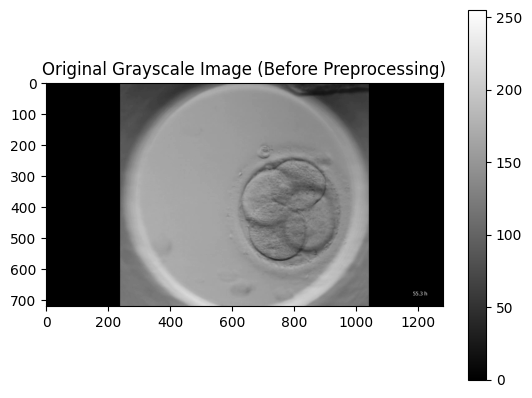

In [38]:
# Get list of image filenames
image_filenames = sorted(os.listdir(image_path))

# Randomly select an image filename
image_name = random.choice(image_filenames)

# Load the original image
original_image = cv2.imread(os.path.join(image_path, image_name))

# Convert to grayscale
original_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# Display the original grayscale image
plt.imshow(original_image_gray, cmap='gray')
plt.title('Original Grayscale Image (Before Preprocessing)')
plt.colorbar()
plt.show()

The code below just splits the normalized image dataset and corresponding mask dataset into training and testing subsets, with 80% of the data used for training and 20% for testing, which is what is mostly used in these cases since it provides a good balance between the training dataset and the testing one.

In [39]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(image_dataset_normalized, mask_dataset, test_size = 0.20, random_state = 0)



* With the command **image_number = random.randint(0, len(X_train))** we generate a random integer between 0 and the length of the training dataset (X_train), selecting a random image index and then we plot an image that we've got in our training set together with its corresponding mask.
* In the last 3 lines of code we just take the height width and number of channels and assign them to 3 variables that will be used for the input in our CNN.



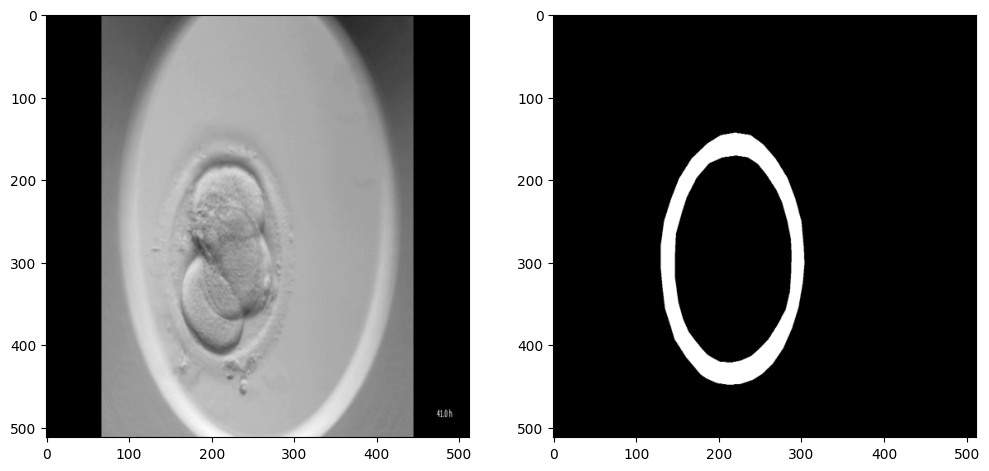

In [40]:
#Check, view few mages
image_number = random.randint(0, len(X_train))
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(X_train[image_number], (512, 512)), cmap='gray')
plt.subplot(122)
plt.imshow(np.reshape(y_train[image_number], (512, 512)), cmap='gray')
plt.show()

###############################################################
IMG_HEIGHT = image_dataset_normalized.shape[1]
IMG_WIDTH  = image_dataset_normalized.shape[2]
IMG_CHANNELS = image_dataset_normalized.shape[3]

In [41]:
def fcn_8(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

    # Contracting path
    conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    pool5 = MaxPooling2D((2, 2))(conv5) # Not used

    # Expanding Path
    up6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5)
    up6 = concatenate([up6, conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up6)
    conv6 = BatchNormalization()(conv6)

    up7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up7)
    conv7 = BatchNormalization()(conv7)

    up8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = concatenate([up8, conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up8)
    conv8 = BatchNormalization()(conv8)

    up9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = concatenate([up9, conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Dropout(0.5)(conv9)  # Adding dropout for regularization

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=outputs)

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    model.summary()

    return model

In [42]:
# Check data types
print(X_train.dtype, y_train.dtype)

# Check pixel values range
print(np.min(X_train), np.max(X_train))

float64 float64
0.0 0.9372549019607843


In [43]:
def get_model():
    return fcn_8(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)

model = get_model()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 512, 512, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_30 (Conv2D)        │ (None, 512, 512, 32)   │            320 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_28    │ (None, 512, 512, 32)   │            128 │ conv2d_30[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_31 (Conv2D)        │ (None, 512, 512, 32)   │          9,248 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_29    │ (None, 512, 512, 32)   │            128 │ conv2d_31[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_10          │ (None, 256, 256, 32)   │              0 │ batch_normalization_2… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_32 (Conv2D)        │ (None, 256, 256, 64)   │         18,496 │ max_pooling2d_10[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_30    │ (None, 256, 256, 64)   │            256 │ conv2d_32[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_33 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_31    │ (None, 256, 256, 64)   │            256 │ conv2d_33[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_11          │ (None, 128, 128, 64)   │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_34 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_11[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_32    │ (None, 128, 128, 128)  │            512 │ conv2d_34[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_35 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_33    │ (None, 128, 128, 128)  │            512 │ conv2d_35[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 6,985,537 (26.65 MB)

 Trainable params: 6,980,609 (26.63 MB)

 Non-trainable params: 4,928 (19.25 KB)

In [44]:
log_dir = "/content/drive/MyDrive/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1, write_graph=True, update_freq='epoch')

In [45]:
#If starting with pre-trained weights.
#model.load_weights('name_of_file.keras')

history = model.fit(X_train, y_train,
                    batch_size=16,
                    verbose=1,
                    epochs=100,  # Adjust the number of epochs
                    validation_data=(X_test, y_test),
                    callbacks=[tensorboard_callback],
                    shuffle=False)

# Save the training history
with open('/content/drive/MyDrive/training_history_final.pkl', 'wb') as f:
    pickle.dump(history.history, f)

#model.save('zona_pellucida_gpu.hdf5')
model.save('zona_pellucida_fcn_sigmoid_final.keras')

Epoch 1/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.4926 - loss: 0.8984 - val_accuracy: 0.8968 - val_loss: 0.5050
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - accuracy: 0.6293 - loss: 0.6907 - val_accuracy: 0.4114 - val_loss: 0.9239
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - accuracy: 0.8498 - loss: 0.5727 - val_accuracy: 0.1340 - val_loss: 7.8654
Epoch 4/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - accuracy: 0.9488 - loss: 0.4518 - val_accuracy: 0.9193 - val_loss: 0.5784
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step - accuracy: 0.9725 - loss: 0.3729 - val_accuracy: 0.9415 - val_loss: 0.3425
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - accuracy: 0.9826 - loss: 0.3102 - val_accuracy: 0.9443 - val_loss: 0.2538
Epoch 7/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - accuracy: 0.9842 - loss: 0.2778 - val_accuracy: 0.9464 - val_loss: 0.2346
Epoch 8/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - accuracy: 0.9864 - loss: 0.2456 - val_accura

In [ ]:
# Load the trained model
model = load_model('/content/drive/MyDrive/zona_pellucida_fcn_sigmoid_final.keras')

In [46]:
#Evaluate the model


	# evaluate model
_, acc = model.evaluate(X_test, y_test)
print("Accuracy = ", (acc * 100.0), "%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.9890 - loss: 0.0310 
Accuracy =  98.91268014907837 %


In [47]:
_, test_loss = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)

_, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9890 - loss: 0.0310 
Test Loss: 0.9891268014907837
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.9890 - loss: 0.0310 
Test Accuracy: 0.9891268014907837


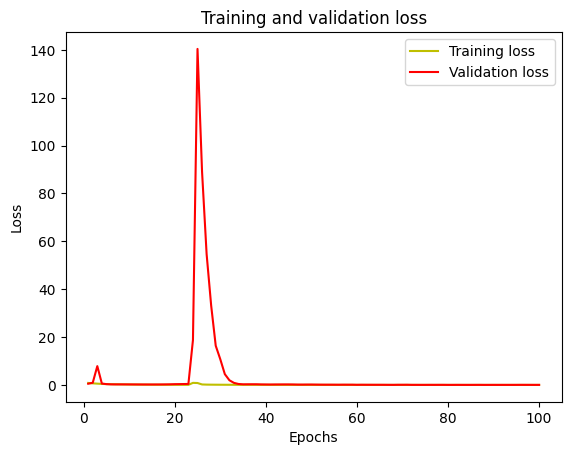

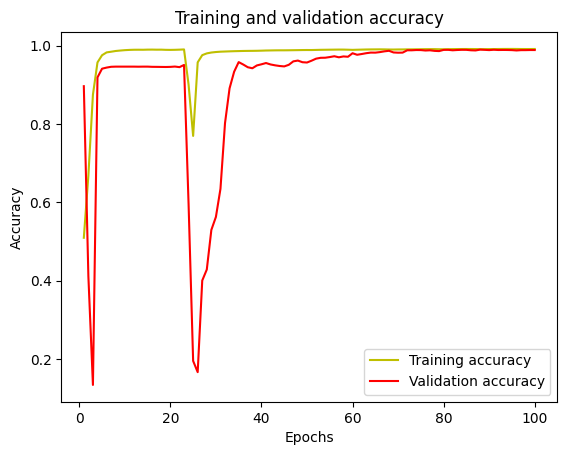

In [48]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

plt.plot(epochs, accuracy, 'y', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Calculating IoU is essential for objectively evaluating and improving segmentation models, ensuring that they accurately and consistently predict the regions of interest in images. It serves as a comprehensive measure of segmentation performance, balancing the trade-offs between precision and recall.

IoU = ∑(A∩B) / ∑(A∪B), where A = PredictedMask and B = GroundTruthMask

In [49]:
#IOU
y_pred=model.predict(X_test)
y_pred_thresholded = y_pred > 0.5

intersection = np.logical_and(y_test, y_pred_thresholded)
union = np.logical_or(y_test, y_pred_thresholded)
iou_score = np.sum(intersection) / np.sum(union)
print("IoU socre is: ", iou_score)

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 809ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 823ms/step
IoU socre is:  0.8805571116605


In [50]:
# Function to calculate Dice coefficient
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

# Calculate Dice coefficient for each test sample
dice_scores = [dice_coefficient(y_test[i], y_pred_thresholded[i]) for i in range(len(y_test))]
average_dice = np.mean(dice_scores)
print("Dice Coefficient for each test sample: ", dice_scores)
print("Average Dice Coefficient: ", average_dice)

Dice Coefficient for each test sample:  [0.9427270313902413, 0.9171544174963487, 0.841027908556468, 0.9273825961045249, 0.9273988433531593, 0.9487649835762044, 0.9107866873431055, 0.9518196546816744, 0.9435093488468511, 0.9574283115133222, 0.94355583653254, 0.9464000109668731, 0.9545283372467313, 0.8624035424885761, 0.9409443249367854, 0.9584194869172138, 0.9561976171604917, 0.767214179309158, 0.9390912354588238, 0.9627172909874613, 0.8816279757562372, 0.9388298489418604, 0.9539825104390901, 0.9575812911745072, 0.9373433730584111, 0.939191490858226, 0.9411866854926401, 0.9473605685886163, 0.9532086173326139, 0.9302639540178036, 0.9619260621380885, 0.9497593969337125, 0.9566078180738969, 0.9541727306693036, 0.9425044734336894, 0.9384778835412729, 0.9423907040532944, 0.9398879909579485, 0.9421061860003381, 0.954658437006724, 0.94298090312577]
Average Dice Coefficient:  0.9342809889380634


Samples with lowest Dice coefficients:


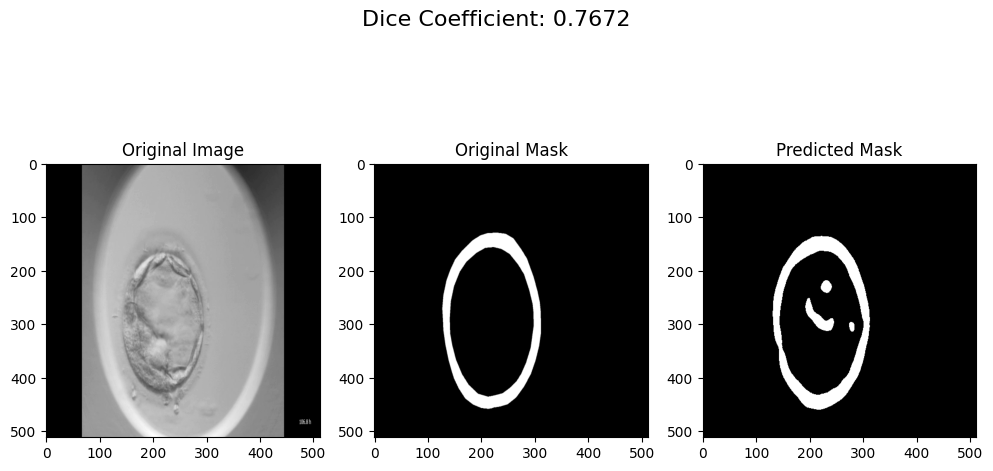

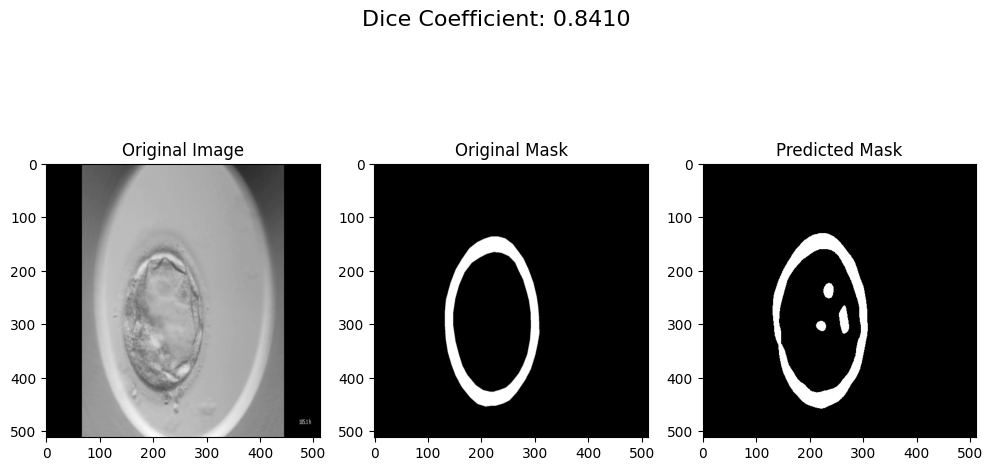

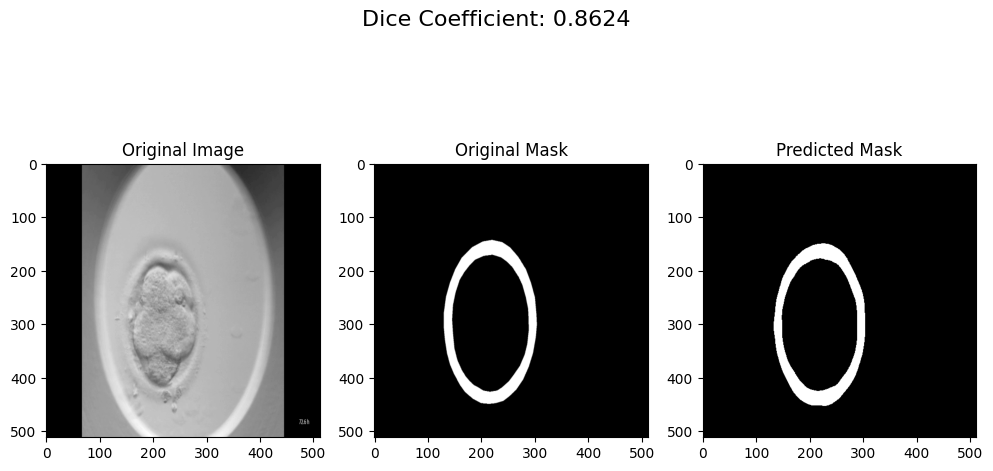

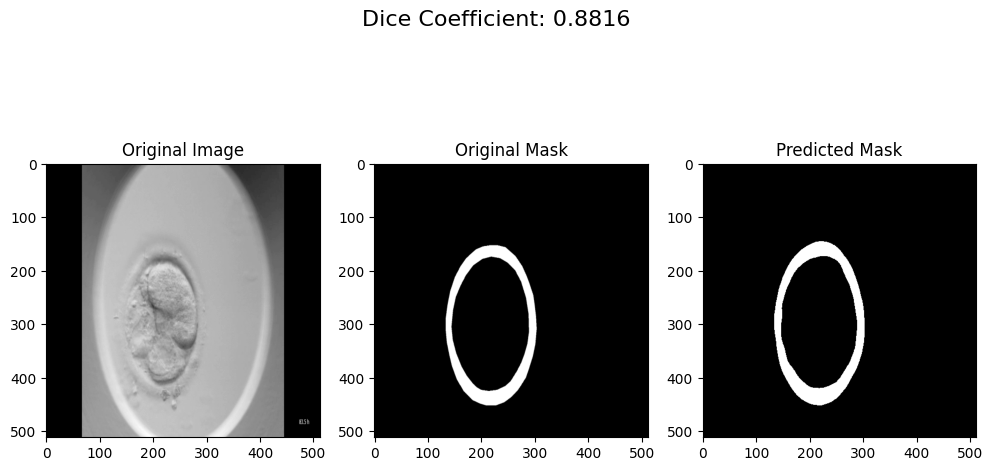

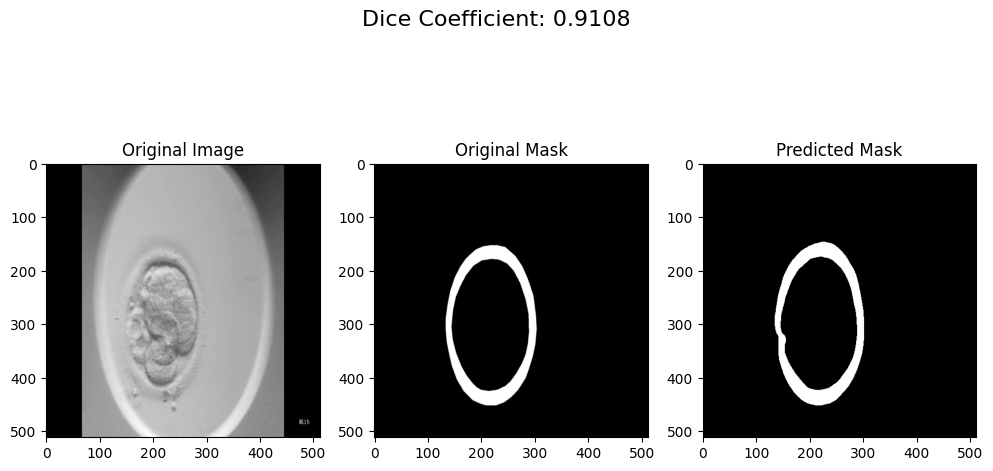

Samples with highest Dice coefficients:


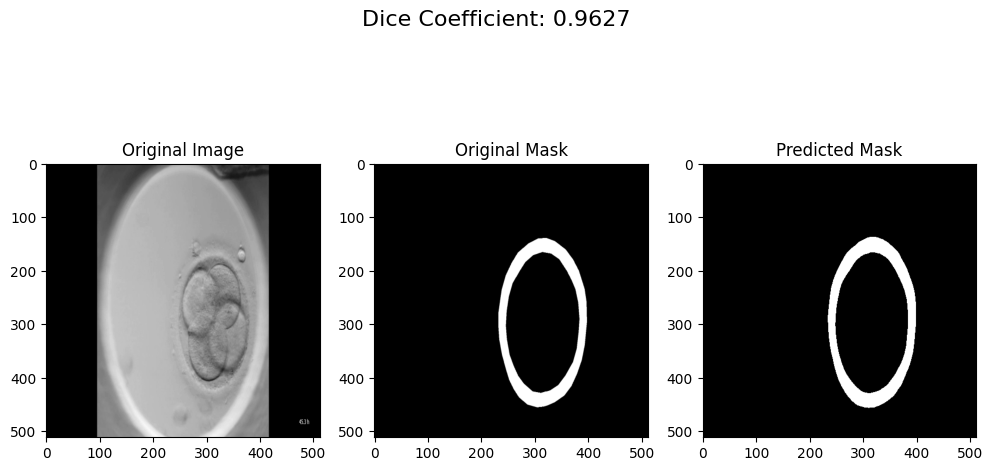

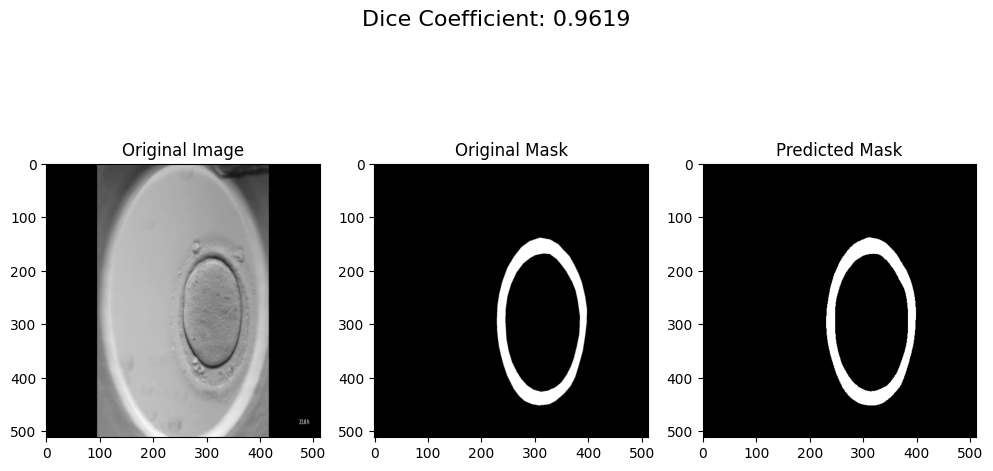

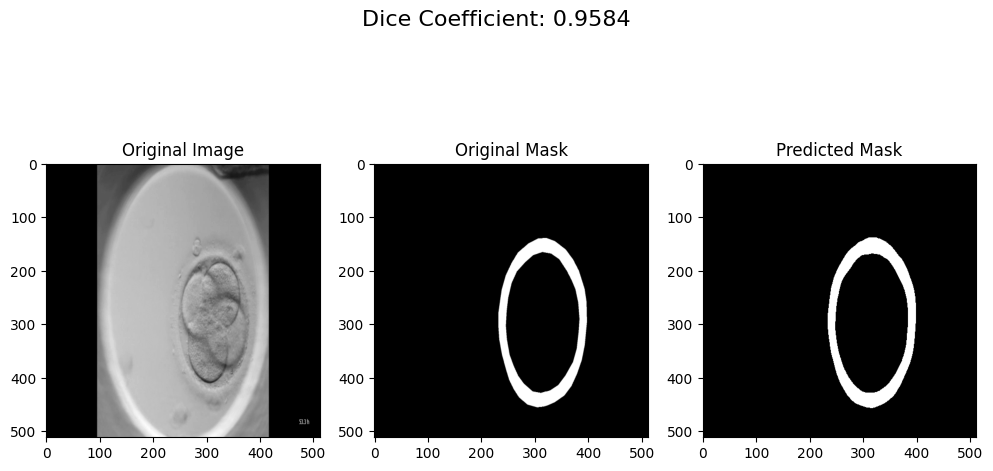

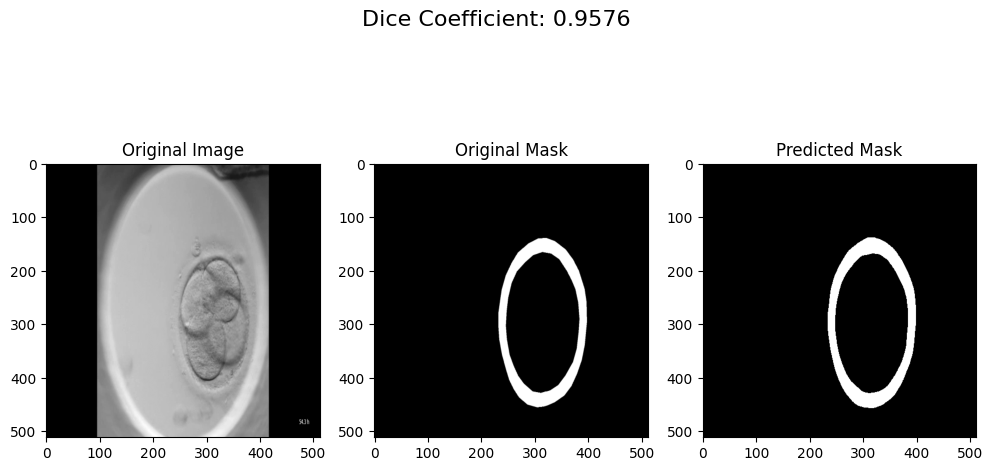

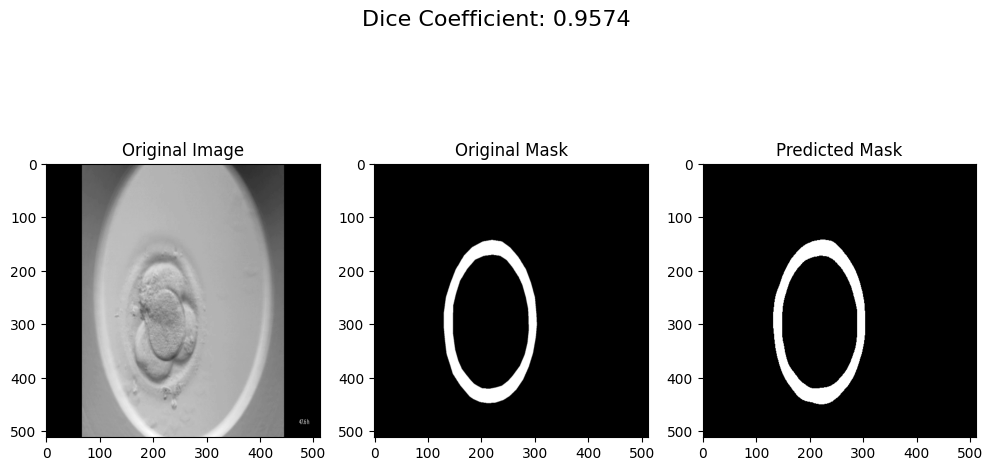

In [51]:
# Function to display a sample image with its mask and predicted mask
def display_sample(index, dice_score):
    plt.figure(figsize=(12, 6))
    plt.suptitle(f'Dice Coefficient: {dice_score:.4f}', fontsize=16)

    plt.subplot(131)
    plt.imshow(np.reshape(X_test[index], (512, 512)), cmap='gray')
    plt.title('Original Image')

    plt.subplot(132)
    plt.imshow(np.reshape(y_test[index], (512, 512)), cmap='gray')
    plt.title('Original Mask')

    plt.subplot(133)
    plt.imshow(np.reshape(y_pred_thresholded[index], (512, 512)), cmap='gray')
    plt.title('Predicted Mask')

    plt.show()

# Sort indices based on Dice coefficients
sorted_indices = np.argsort(dice_scores)

# Display a few samples with the lowest Dice coefficients
print("Samples with lowest Dice coefficients:")
for i in range(5):
    display_sample(sorted_indices[i], dice_scores[sorted_indices[i]])

# Display a few samples with the highest Dice coefficients
print("Samples with highest Dice coefficients:")
for i in range(5):
    display_sample(sorted_indices[-(i+1)], dice_scores[sorted_indices[-(i+1)]])



*  **num_test_images = int(len(X_test) * test_size)** will calculate the number of images in the test set based on the test size proportion.
*  **test_img_number = random.randint(0, num_test_images)** will generate a random integer between 0 and the number of test images to select a random image index.
*  **test_img = X_test[test_img_number]** selects the test image corresponding to the randomly generated index.
*  **ground_truth = y_test[test_img_number]** selects the ground truth mask corresponding to the randomly generated index.
*  **test_img_norm = test_img[:, :, 0][:, :, None]** extracts the first channel of the test image and reshapes it to ensure it has a single channel.
*  **test_img_input = np.expand_dims(test_img_norm, 0)** expands the dimensions of the normalized test image to match the input shape expected by the model (batch size, height, width, channels).




In [52]:
# Predict on a few images
model = get_model()
model.load_weights('/content/drive/MyDrive/zona_pellucida_fcn_sigmoid_final.keras')  # Trained for 100 epochs


# Assuming you used 20% for the test set
test_size = 0.20
num_test_images = int(len(X_test) * test_size)

# Randomly select an image from the test set
test_img_number = random.randint(0, num_test_images)
test_img = X_test[test_img_number]
ground_truth = y_test[test_img_number]

# Normalize the image for prediction
test_img_norm = test_img[:, :, 0][:, :, None]
test_img_input = np.expand_dims(test_img_norm, 0)

# Perform prediction
prediction = (model.predict(test_img_input)[0, :, :, 0] > 0.5).astype(np.uint8)

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 512, 512, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_45 (Conv2D)        │ (None, 512, 512, 32)   │            320 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_42    │ (None, 512, 512, 32)   │            128 │ conv2d_45[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_46 (Conv2D)        │ (None, 512, 512, 32)   │          9,248 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_43    │ (None, 512, 512, 32)   │            128 │ conv2d_46[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_15          │ (None, 256, 256, 32)   │              0 │ batch_normalization_4… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_47 (Conv2D)        │ (None, 256, 256, 64)   │         18,496 │ max_pooling2d_15[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_44    │ (None, 256, 256, 64)   │            256 │ conv2d_47[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_48 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_45    │ (None, 256, 256, 64)   │            256 │ conv2d_48[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_16          │ (None, 128, 128, 64)   │              0 │ batch_normalization_4… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_49 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_16[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_46    │ (None, 128, 128, 128)  │            512 │ conv2d_49[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_50 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_47    │ (None, 128, 128, 128)  │            512 │ conv2d_50[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 6,985,537 (26.65 MB)

 Trainable params: 6,980,609 (26.63 MB)

 Non-trainable params: 4,928 (19.25 KB)

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 134 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step









* **random.randint(a, b)** generates a random integer between a and b inclusive. Here, it randomly selects an index from the test set, where **num_test_images** is the starting index and **len(X_test) - 1** is the ending index.
* **test_img** retrieves the image from **X_test** using the randomly selected index.

* **ground_truth** retrieves the corresponding ground truth mask from **y_test**.
* **test_img[:, :, 0][:, :, None]** extracts the first channel and adds an extra dimension to make it compatible with the model's input shape. Essentially, it reshapes the image to (height, width, 1).

* **np.expand_dims** adds an extra dimension to the image, making it (1, height, width, 1), which is required for the model input (batch size dimension).
* **model.predict(test_img_input)** performs prediction using the model. It returns a probability map.
<br>**[0, :, :, 0]** selects the first batch and the first channel from the prediction.
<br>**> 0.5** applies a threshold to convert probabilities to binary values (masking).
<br>**.astype(np.uint8)** converts the boolean mask to an unsigned 8-bit integer array.







1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


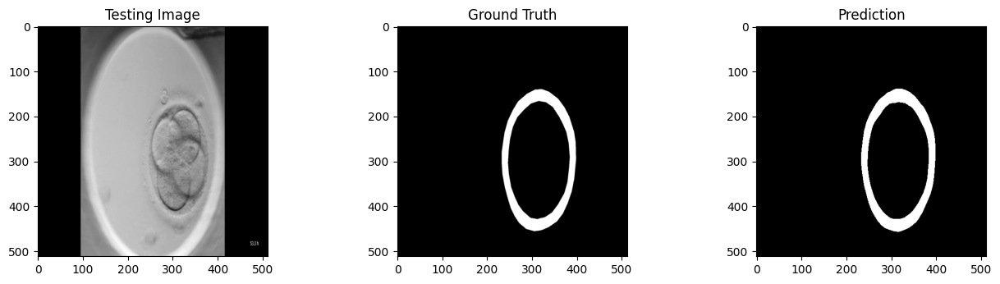

In [53]:
# Randomly select another image from the test set
test_img_number = random.randint(num_test_images, len(X_test) - 1)
test_img = X_test[test_img_number]
ground_truth = y_test[test_img_number]

# Normalize the image for prediction
test_img_norm = test_img[:, :, 0][:, :, None]
test_img_input = np.expand_dims(test_img_norm, 0)

# Perform prediction
prediction = (model.predict(test_img_input)[0, :, :, 0] > 0.5).astype(np.uint8)

# Visualize the new image, ground truth mask, and prediction
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:, :, 0], cmap='gray')
plt.subplot(232)
plt.title('Ground Truth')
plt.imshow(ground_truth[:, :, 0], cmap='gray')
plt.subplot(233)
plt.title('Prediction')
plt.imshow(prediction, cmap='gray')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


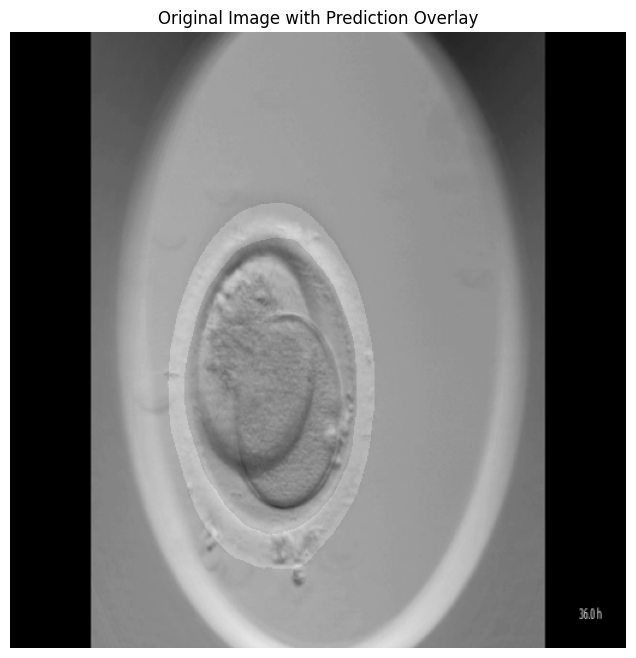

In [54]:
# Assuming we have already performed the prediction and have 'X_test' and 'y_test' available

# Get the number of images in the test set
num_test_images = len(X_test)

# Randomly select an image from the test set
random_index = random.randint(0, num_test_images - 1)
test_img = X_test[random_index]
ground_truth = y_test[random_index]

# Normalize the image for prediction
test_img_norm = test_img[:, :, 0][:, :, None]
test_img_input = np.expand_dims(test_img_norm, 0)

# Perform prediction
prediction = (model.predict(test_img_input)[0, :, :, 0] > 0.5).astype(np.uint8)

# Overlay the prediction on the original image
overlay = np.zeros_like(test_img[:, :, 0])
overlay[prediction == 1] = 255  # Set the overlay region to white where the prediction is positive
alpha = 0.4  # Set the transparency level

# Create a figure and plot the original image
plt.figure(figsize=(8, 8))
plt.imshow(test_img[:, :, 0], cmap='gray')

# Overlay the prediction with transparency
plt.imshow(overlay, cmap='gray', alpha=0.1)

plt.title('Original Image with Prediction Overlay')
plt.axis('off')
plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 403ms/step


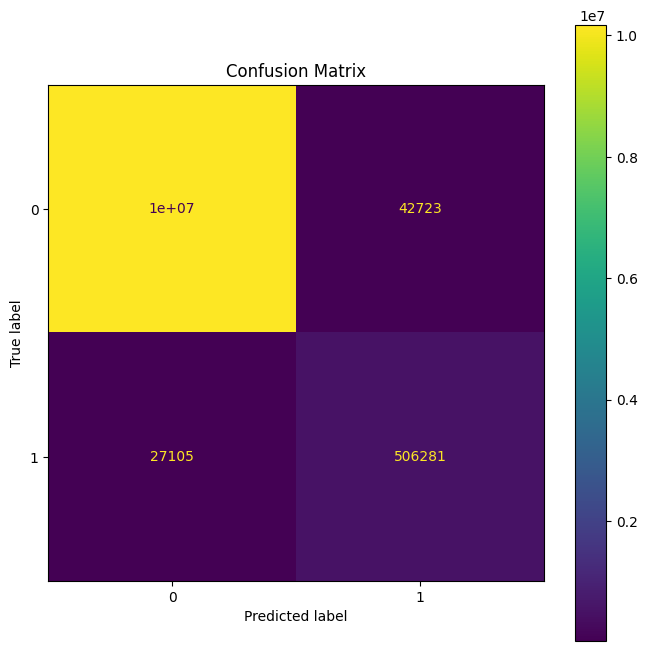

True Negatives (TN): 10171795
False Positives (FP): 42723
False Negatives (FN): 27105
True Positives (TP): 506281
Accuracy: 0.9935
Precision: 0.9222
Recall: 0.9492
F1 Score: 0.9355


In [55]:
# Make predictions on the test set
y_pred = (model.predict(X_test) > 0.5).astype(np.uint8)

# Ensure y_test is binary
y_test_binary = (y_test > 0.5).astype(np.uint8)

# Flatten the predictions and ground truth masks
y_pred_flat = y_pred.flatten()
y_test_flat = y_test_binary.flatten()

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test_flat, y_pred_flat)

# Display the confusion matrix
fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay(conf_matrix).plot(ax=ax)
plt.title('Confusion Matrix')
plt.show()

# Print the confusion matrix values
tn, fp, fn, tp = conf_matrix.ravel()
print(f'True Negatives (TN): {tn}')
print(f'False Positives (FP): {fp}')
print(f'False Negatives (FN): {fn}')
print(f'True Positives (TP): {tp}')

# Calculate other metrics from the confusion matrix if needed
accuracy = (tp + tn) / (tp + tn + fp + fn)
precision = tp / (tp + fp)
recall = tp / (tp + fn)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1_score:.4f}')

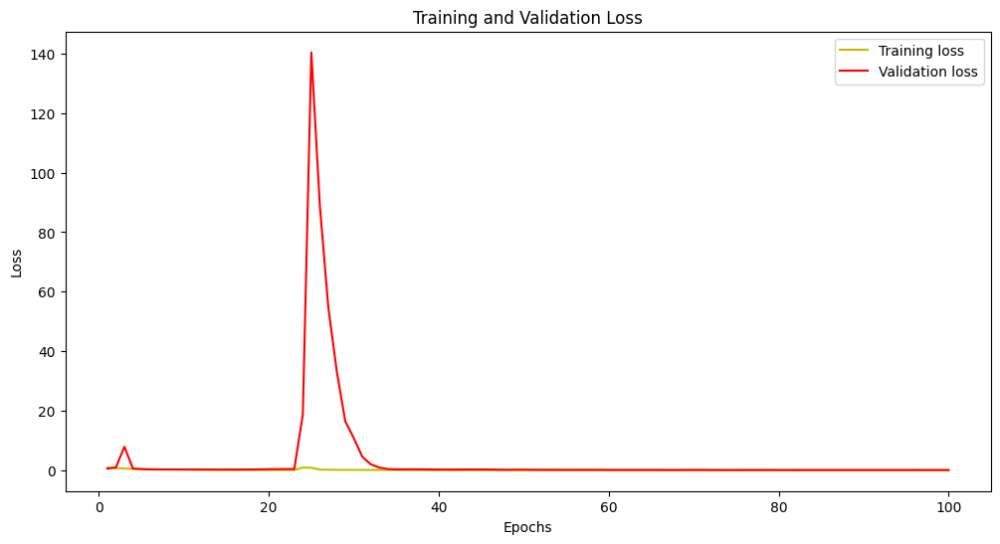

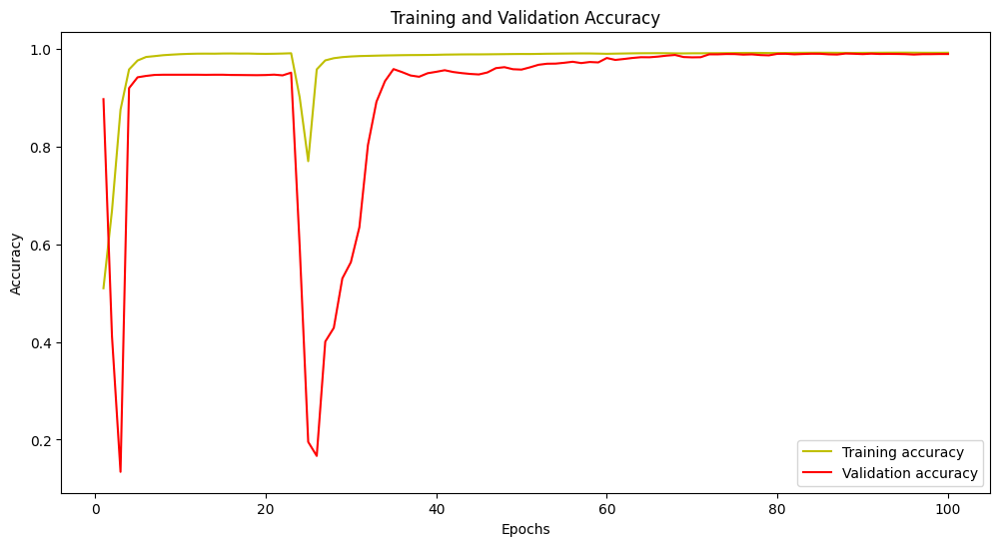

In [56]:
# Load the training history
with open('/content/drive/MyDrive/training_history_final.pkl', 'rb') as f:
    history = pickle.load(f)

# Extract the metrics
loss = history['loss']
val_loss = history['val_loss']
accuracy = history['accuracy']
val_accuracy = history['val_accuracy']
epochs = range(1, len(loss) + 1)

# Plotting training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(epochs, accuracy, 'y', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

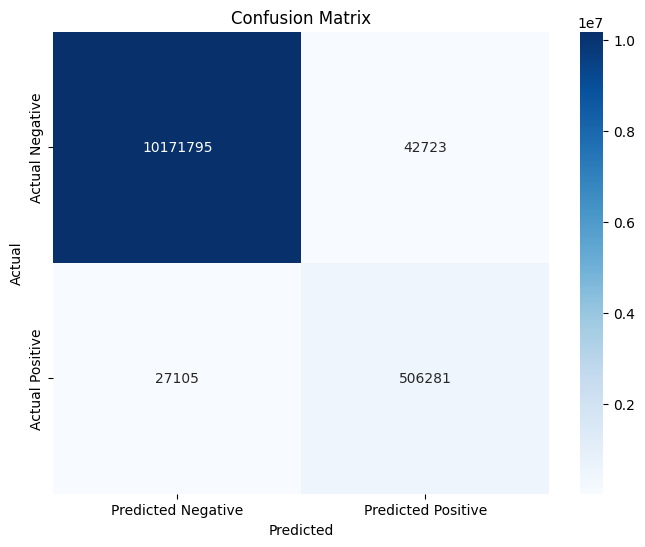

In [57]:
# Plotting the confusion matrix using seaborn for better visualization
conf_matrix_df = pd.DataFrame(conf_matrix, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

{'accuracy': [0.5097704529762268, 0.6687648892402649, 0.8751602172851562, 0.9575830101966858, 0.9758574366569519, 0.9830962419509888, 0.9848443269729614, 0.986719012260437, 0.9878398776054382, 0.9888255596160889, 0.9894717931747437, 0.9898561835289001, 0.9899225234985352, 0.989834189414978, 0.990168035030365, 0.9902501702308655, 0.9900326728820801, 0.990103542804718, 0.9896569848060608, 0.9895064234733582, 0.9897135496139526, 0.990118145942688, 0.9906798601150513, 0.9006378650665283, 0.7698559761047363, 0.9576742649078369, 0.9760845303535461, 0.98057621717453, 0.9827953577041626, 0.9840741753578186, 0.984918475151062, 0.9853572249412537, 0.9858013391494751, 0.9861974716186523, 0.9864828586578369, 0.9867802858352661, 0.9869680404663086, 0.9870525598526001, 0.9872363209724426, 0.9875193238258362, 0.9879148602485657, 0.9881095886230469, 0.9883351922035217, 0.9884293675422668, 0.9884340167045593, 0.9885596036911011, 0.9887237548828125, 0.9888944029808044, 0.9890910983085632, 0.989201128482

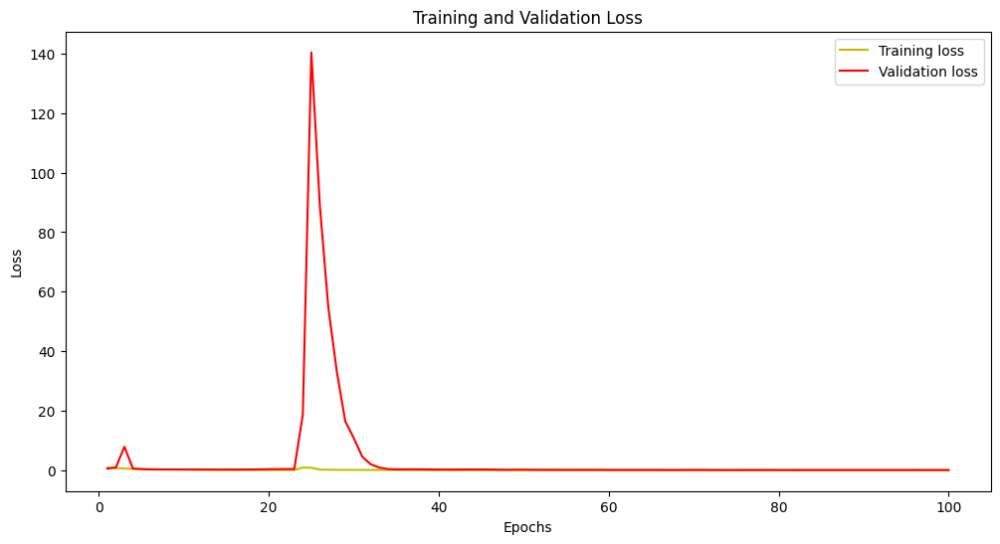

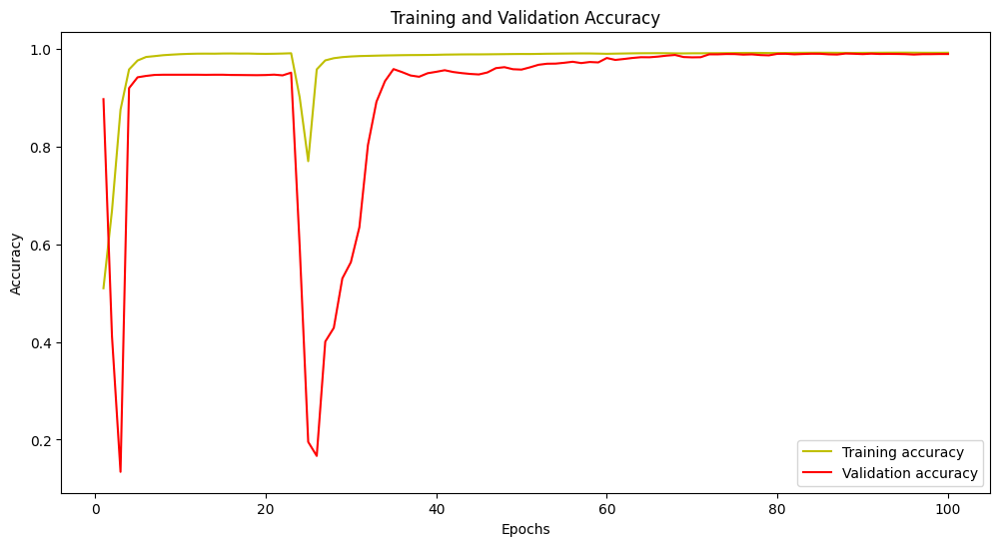

In [58]:
# Path to your .pkl file
file_path = '/content/drive/MyDrive/training_history_final.pkl'

# Load the .pkl file
with open(file_path, 'rb') as f:
    data = pickle.load(f)

# Inspect the contents
print(data)

# If the .pkl file contains a dictionary (e.g., training history)
if isinstance(data, dict):
    # Print keys
    print("Keys:", data.keys())

    # Print a summary of contents
    for key, value in data.items():
        print(f"{key}: {len(value)} entries")

    # Example: print the first few entries of 'loss'
    if 'loss' in data:
        print("Loss (first 5 entries):", data['loss'][:5])

# Further visualization or manipulation if needed
# For example, if it's training history, you can plot it:
import matplotlib.pyplot as plt

if 'loss' in data and 'val_loss' in data:
    epochs = range(1, len(data['loss']) + 1)

    plt.figure(figsize=(12, 6))
    plt.plot(epochs, data['loss'], 'y', label='Training loss')
    plt.plot(epochs, data['val_loss'], 'r', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    if 'accuracy' in data and 'val_accuracy' in data:
        plt.figure(figsize=(12, 6))
        plt.plot(epochs, data['accuracy'], 'y', label='Training accuracy')
        plt.plot(epochs, data['val_accuracy'], 'r', label='Validation accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


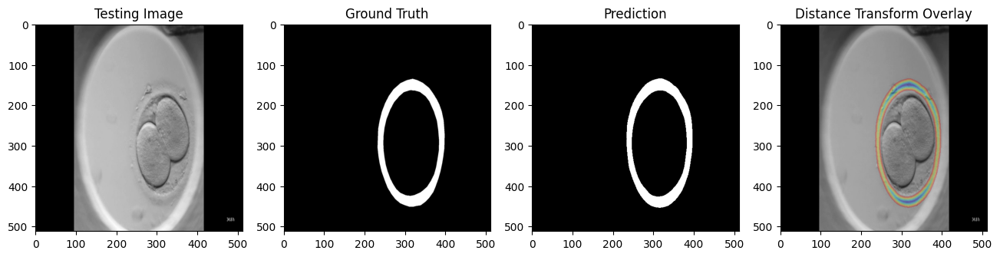

In [59]:
# Randomly select an image from the test set
test_img_number = random.randint(0, num_test_images - 1)
test_img = X_test[test_img_number]
ground_truth = y_test[test_img_number]

# Normalize the image for prediction
test_img_norm = test_img[:, :, 0][:, :, None]
test_img_input = np.expand_dims(test_img_norm, 0)

# Perform prediction
prediction = (model.predict(test_img_input)[0, :, :, 0] > 0.5).astype(np.uint8)

# Compute the distance transform on the predicted mask
dist_transform = distance_transform_edt(prediction)

# Normalize the distance transform for better visualization
dist_transform_normalized = cv2.normalize(dist_transform, None, 0, 255, cv2.NORM_MINMAX)
dist_transform_normalized = dist_transform_normalized.astype(np.uint8)

# Create a color map for overlay
overlay = cv2.applyColorMap(dist_transform_normalized, cv2.COLORMAP_JET)

# Convert the test image to uint8 and then to 3-channel if it is single-channel
test_img_uint8 = (test_img[:, :, 0] * 255).astype(np.uint8)
test_img_color = cv2.cvtColor(test_img_uint8, cv2.COLOR_GRAY2BGR)

# Overlay the distance transform on the original image
alpha = 0.3  # Transparency factor
mask = dist_transform_normalized > 0
overlayed_img = test_img_color.copy()
overlayed_img[mask] = cv2.addWeighted(test_img_color, 1 - alpha, overlay, alpha, 0)[mask]

# Visualize the new image, ground truth mask, prediction, and overlayed image
plt.figure(figsize=(16, 8))

plt.subplot(241)
plt.title('Testing Image')
plt.imshow(test_img[:, :, 0], cmap='gray')

plt.subplot(242)
plt.title('Ground Truth')
plt.imshow(ground_truth[:, :, 0], cmap='gray')

plt.subplot(243)
plt.title('Prediction')
plt.imshow(prediction, cmap='gray')

plt.subplot(244)
plt.title('Distance Transform Overlay')
plt.imshow(overlayed_img)

plt.show()

In [60]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 12875), started 0:12:40 ago. (Use '!kill 12875' to kill it.)

<IPython.core.display.Javascript object>